In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

/hpc/group/pbenfeylab/ch416/miniconda3/envs/genesys/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
## Conda Env genesys on DCC
print(torch.__version__)
print(sc.__version__) 

1.11.0
1.9.6


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
#dataset = Root_Dataset(data['X_test'], data['y_test'])
#loader = DataLoader(dataset,
#                         batch_size = batch_size,
#                         shuffle = True, drop_last=True)

X_all = np.vstack((data['X_train'],data['X_val'],data['X_test']))
y_all = pd.concat((data['y_train'],data['y_val'],data['y_test']))
dataset = Root_Dataset(X_all, y_all)
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [6]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

## Extract a sample

In [7]:
sample = next(iter(loader))
xo = sample['x'].to(device)
y = sample['y'].to(device)
y_label = [num2class[i] for i in y.tolist()]

In [8]:
xo.shape

torch.Size([2000, 11, 17513])

In [9]:
len(y_label)

2000

In [10]:
len(loader)

55

In [11]:
## GRN for the transition t3 to t5
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            #pred_h = model.init_hidden(batch_size)
            #tfrom = model.generate_current(x, pred_h, 0).to('cpu').detach().numpy()
            #cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            cfrom = x[np.where(np.array(y_label)==ct)[0],3,:] 
            
            #pred_h = model.init_hidden(batch_size)
            #tto = model.generate_next(x, pred_h, 0).to('cpu').detach().numpy()   
            #cto = tto[np.where(np.array(y_label)==ct)[0],:]
            cto = x[np.where(np.array(y_label)==ct)[0],5,:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast


/tmp/ipykernel_880125/1395650234.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()


Trichoblast
Cortex
Endodermis
Pericycle
Procambium
Xylem
Phloem
Lateral Root Cap
Columella


In [12]:
# Save the array to disk
np.save('genesys_raw_ctw_t3-t5.npy', ctw)

In [11]:
ctw = np.load('genesys_raw_ctw_t3-t5.npy')

In [12]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    if np.std(ctw[i])==0:
        ctw_z[i] = np.zeros((17513, 17513))
    else:
        ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [13]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [14]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [15]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [16]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

Name
NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: count, dtype: int64

## Network Analysis

In [17]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [18]:
def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

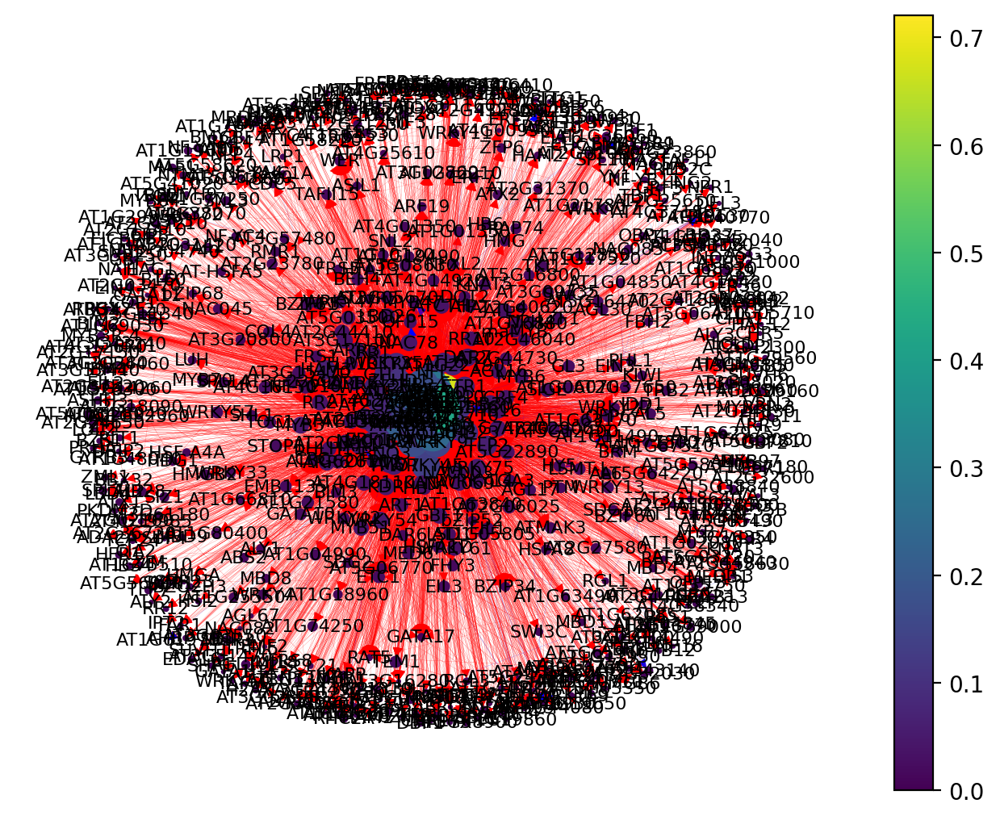

In [19]:
atri = network(0)

In [20]:
atri

,degree_centrality,out_centrality,in_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
GL2,0.621374,0.337405,0.283969,0.822793,0.000220,0.154203
KDR,0.374046,0.045802,0.328244,0.782361,0.000215,0.128245
PHE1,0.134351,0.122137,0.012214,0.772895,0.000187,0.067567
IAA1,0.114504,0.042748,0.071756,0.728954,0.000169,0.058109
AT4G31650,0.285496,0.145038,0.140458,0.689047,0.000188,0.110174
...,...,...,...,...,...,...
FRS10,0.007634,0.001527,0.006107,0.000000,0.000117,0.007585
BZO2H3,0.007634,0.006107,0.001527,0.000000,0.000105,0.007373
LUG,0.009160,0.000000,0.009160,0.000000,0.000127,0.012093
PIE1,0.007634,0.003053,0.004580,0.000000,0.000130,0.009628


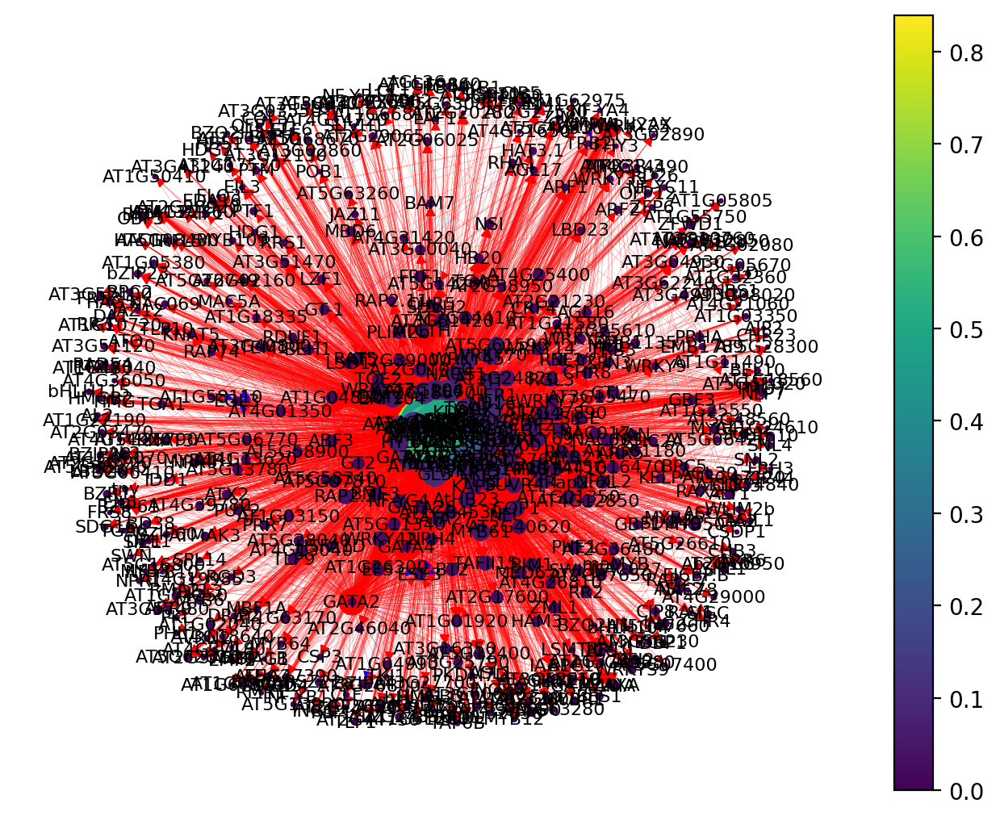

In [21]:
tri = network(1)

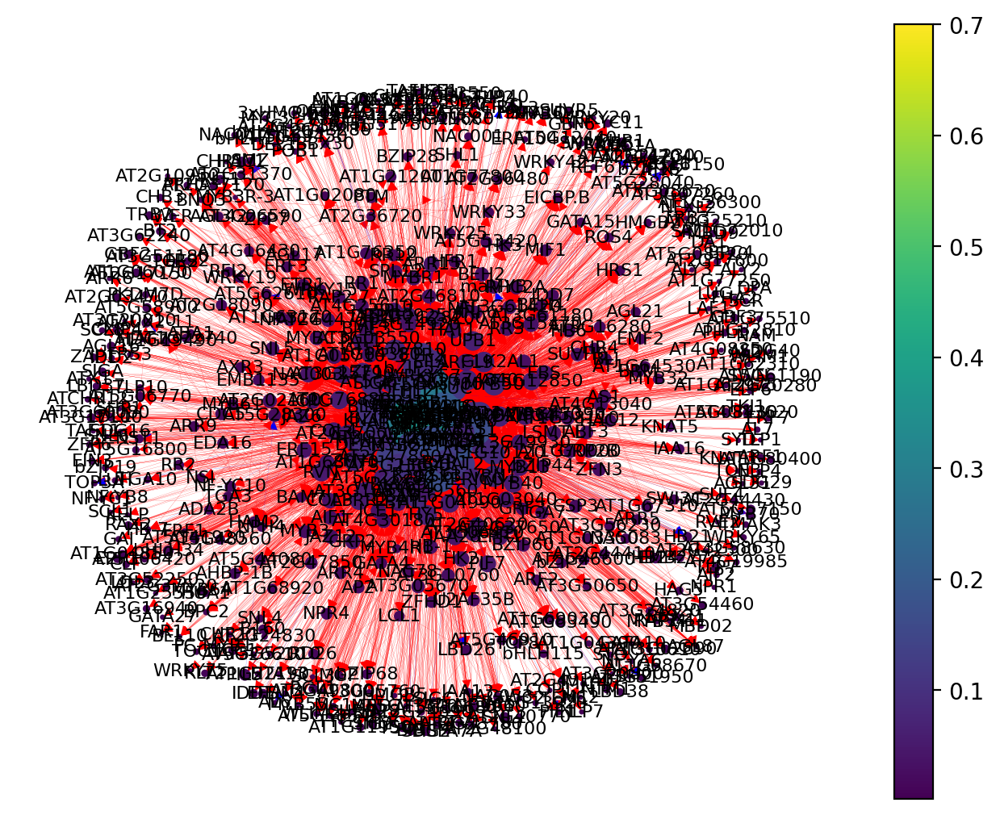

In [22]:
cor = network(2)

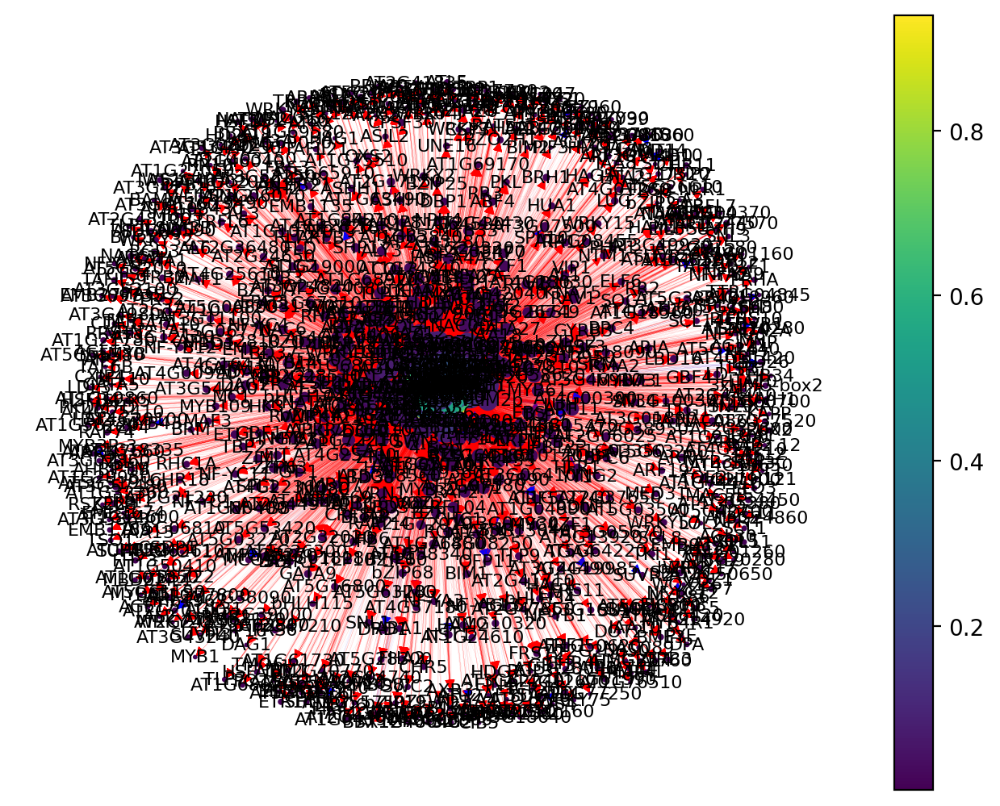

In [23]:
end = network(3)

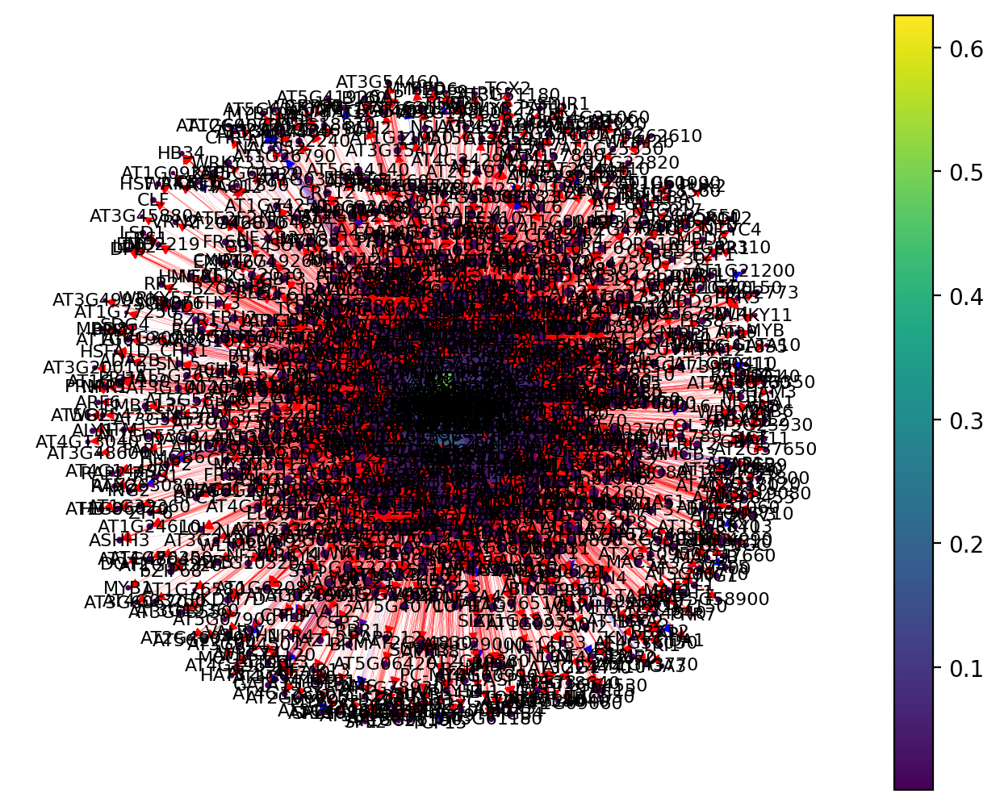

In [24]:
per = network(4)

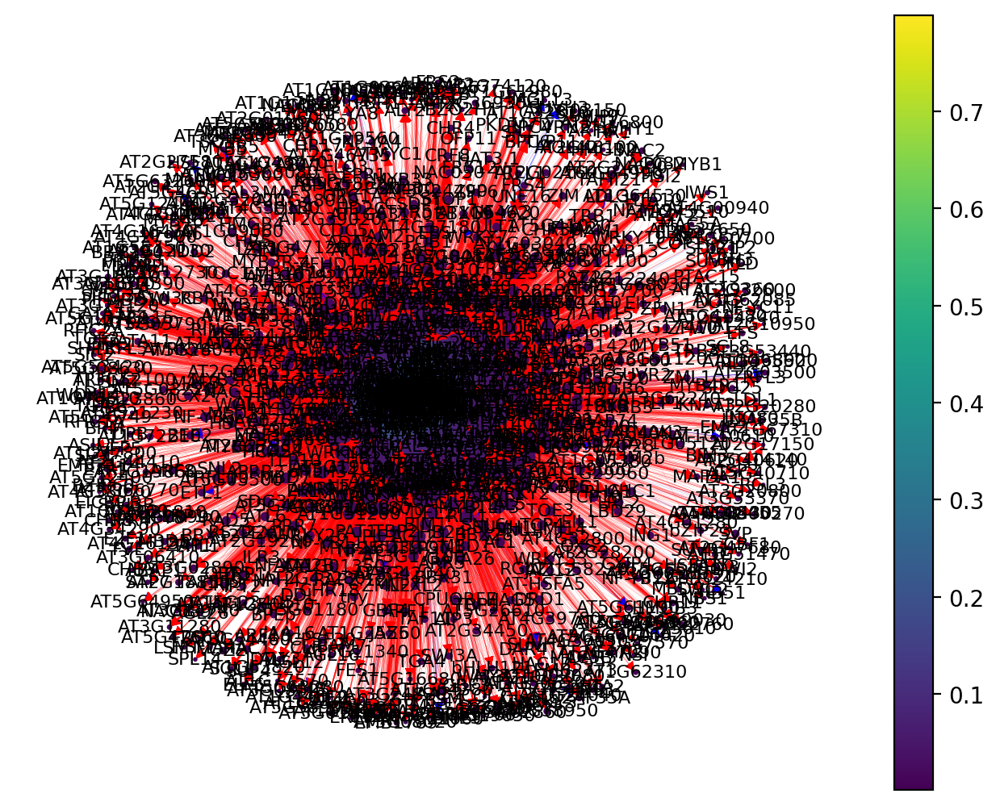

In [25]:
pro = network(5)

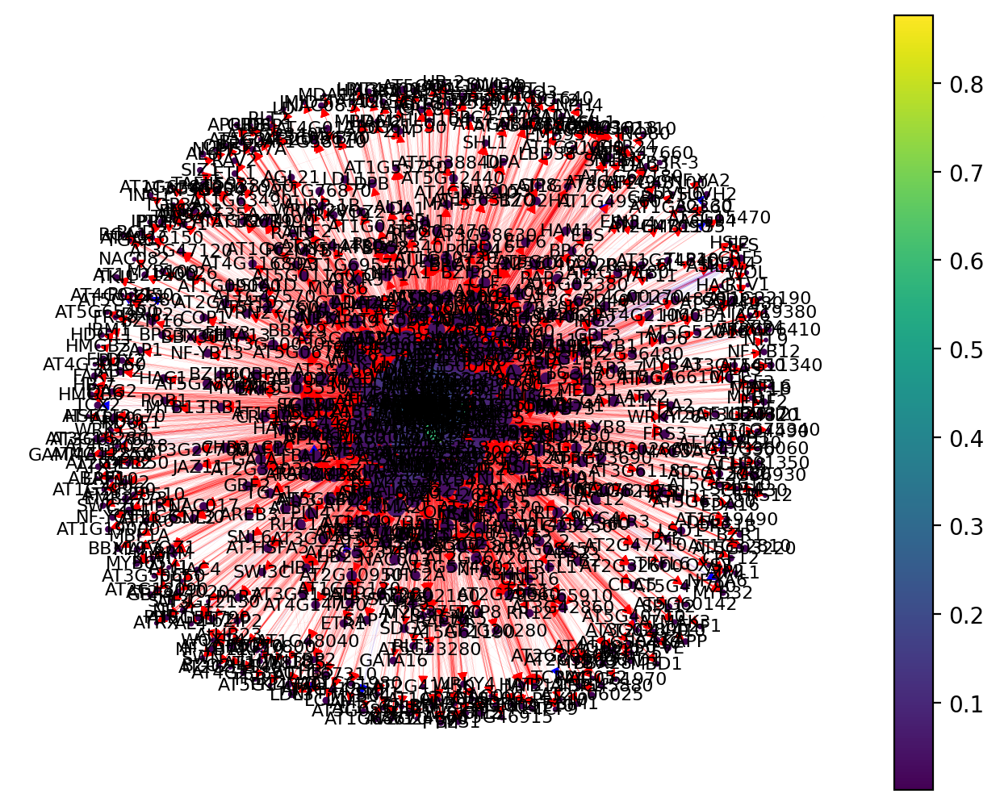

In [26]:
xyl = network(6)

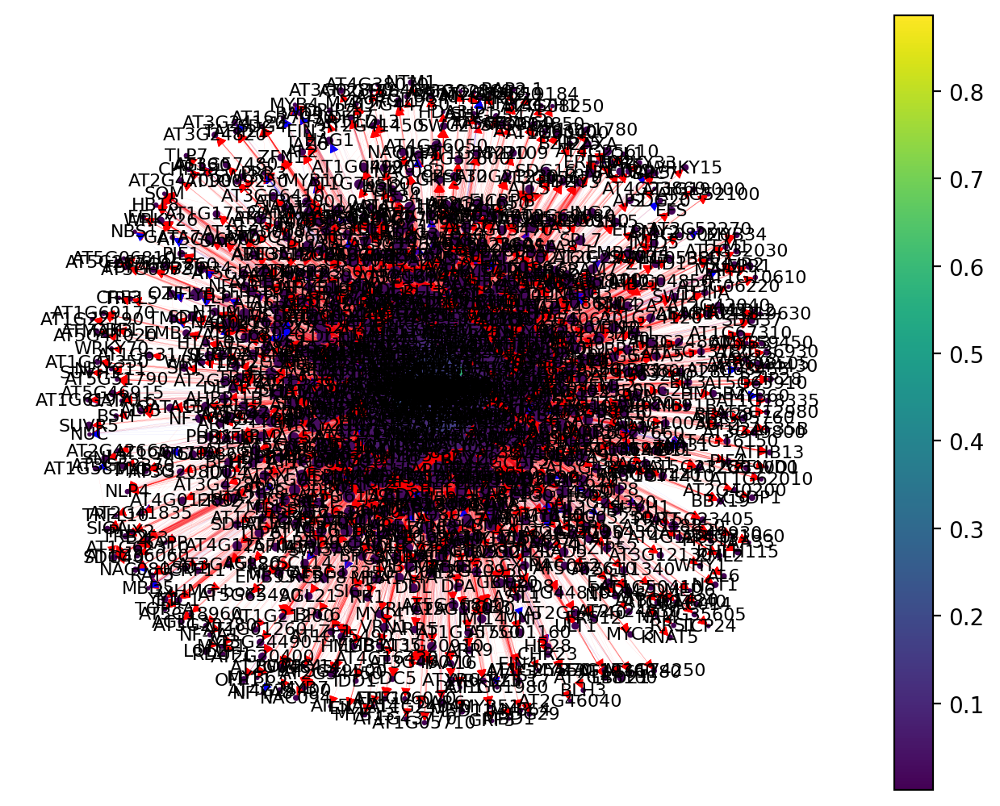

In [27]:
phl = network(7)

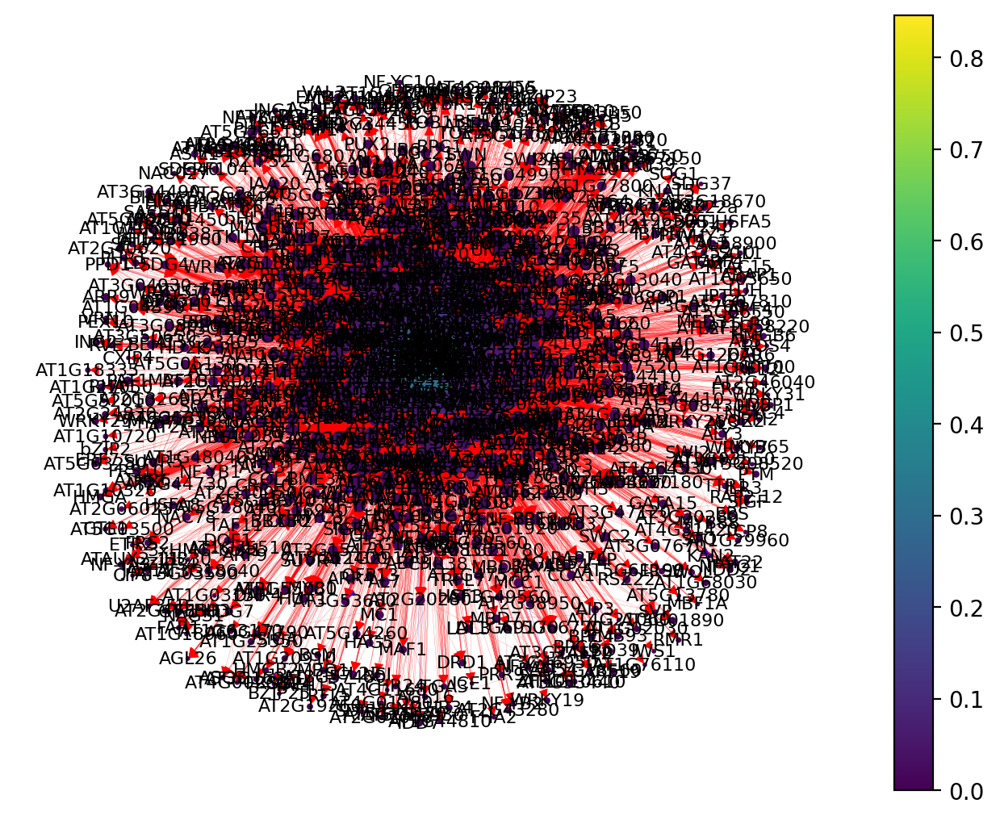

In [28]:
lrc = network(8)

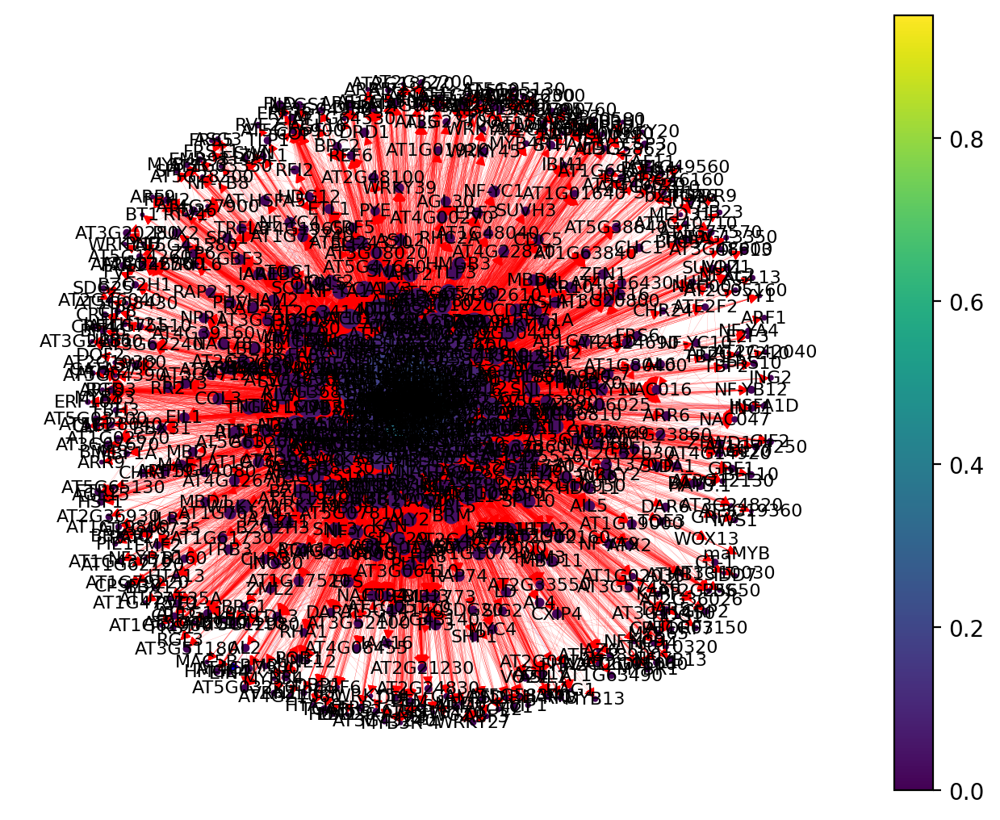

In [29]:
col = network(9)

In [30]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [31]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts())
tf_occurance = tf_occurance.rename(columns={
    'count': 'tf_occurance'
})
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [32]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum
ATS,0.007573,0.006909,0.075989,0.047328,0.00969,0.142070,0.412214,0.160853,0.264317,9,10.126943
RHC2A,0.010750,0.000143,0.000010,0.007634,0.00969,0.052863,0.021374,0.027132,0.024229,9,9.153825


In [33]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
WRKY65,0.001515,0.126620,0.151145,0.579457,0.087023,0.393411,6,7.339171
PHE1,0.772895,0.001099,0.122137,0.025194,0.012214,0.003876,6,6.937415
AT2G37120,0.008119,0.022876,0.146565,0.503876,0.109924,0.114341,6,6.905700
ERF104,0.011700,0.132242,0.091603,0.050388,0.074809,0.038760,6,6.399502
MYB45,0.000329,0.000008,0.280916,0.015504,0.009160,0.005814,6,6.311731
CRF4,0.005862,0.000045,0.036641,0.013566,0.181679,0.050388,6,6.288181
WRKY61,0.073308,0.020392,0.030534,0.129845,0.009160,0.021318,6,6.284558
WRKY45,0.008525,0.015060,0.134351,0.069767,0.010687,0.003876,6,6.242267
GL3,0.001501,0.000715,0.019847,0.096899,0.007634,0.015504,6,6.142100
WRKY42,0.000423,0.000162,0.018321,0.034884,0.010687,0.054264,6,6.118739


In [34]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
GL2,0.822793,0.337405,0.283969,3,4.444167
AT4G31650,0.689047,0.145038,0.140458,3,3.974543
TRY,0.625422,0.082443,0.114504,3,3.822369
MYB47,0.433536,0.018321,0.010687,3,3.462544
BNQ3,0.424570,0.090076,0.140458,3,3.655104
OFP18,0.399559,0.215267,0.082443,3,3.697269
MEA,0.079443,0.279389,0.030534,3,3.389367
TTG2,0.042475,0.427481,0.213740,3,3.683696
AT2G28710,0.029131,0.215267,0.013740,3,3.258139
NAC6,0.006700,0.212214,0.003053,3,3.221967


In [35]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
RSL4,0.400903,0.684109,0.042636,3,4.127647
AT4G09100,0.391574,0.759690,0.019380,3,4.170644
RHD6,0.298728,0.494186,0.230620,3,4.023534
LRL3,0.183950,0.662791,0.032946,3,3.879687
AT3G53370,0.153357,0.827519,0.358527,3,4.339403
RSL1,0.120291,0.015504,0.021318,3,3.157112
SUVR4,0.108617,0.038760,0.071705,3,3.219083
ATMYC1,0.086987,0.137597,0.147287,3,3.371871
EGL3,0.045590,0.011628,0.048450,3,3.105667
AT5G04390,0.015350,0.060078,0.003876,3,3.079303


In [36]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
CRF11,0.716023,0.015419,0.047357,3,3.778798
E2F3,0.556675,0.038546,0.101322,3,3.696543
ARF8,0.550293,0.034141,0.160793,3,3.745227
AT2G36026,0.516237,0.061674,0.048458,3,3.626369
AT3G55080,0.506070,0.008811,0.012115,3,3.526995
...,...,...,...,...,...
AT1G19000,0.000001,0.056167,0.042952,3,3.099120
SPL13A,0.000001,0.015419,0.001101,3,3.016521
AT3G24490,0.000001,0.006608,0.004405,3,3.011014
HDG2,0.000001,0.037445,0.079295,3,3.116741


In [37]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
AT5G03220,0.355417,0.005229,0.035294,3,3.395940
NAC016,0.143016,0.011765,0.111111,3,3.265892
HSFA8,0.132959,0.024837,0.043137,3,3.200932
NAM,0.080385,0.194771,0.016993,3,3.292150
NAC069,0.058469,0.049673,0.027451,3,3.135594
...,...,...,...,...,...
AT4G08455,0.000003,0.009150,0.006536,3,3.015690
ASIL2,0.000003,0.019608,0.026144,3,3.045755
SUVH6,0.000002,0.047059,0.036601,3,3.083662
AT3G20280,0.000002,0.006536,0.018301,3,3.024838


In [38]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
AT4G30180,0.905383,0.990621,0.028881,0.046256,0.126354,0.092511,6,8.190006
RVN,0.603378,0.903634,0.050542,0.018722,0.092058,0.035242,6,7.703575
JKD,0.041020,0.298130,0.422383,0.285242,0.310469,0.225771,6,7.583016
AT3G24120,0.001430,0.985591,0.088448,0.174009,0.028881,0.127753,6,7.406111
ERF15,0.001808,0.907057,0.034296,0.135463,0.045126,0.070485,6,7.194235
BLJ,0.008275,0.088271,0.019856,0.642070,0.046931,0.270925,6,7.076328
BIB,0.001727,0.698725,0.009025,0.162996,0.018051,0.146476,6,7.036999
AT3G61420,0.001289,0.001372,0.027076,0.093612,0.028881,0.051762,6,6.203993
AT1G05710,0.006362,0.000427,0.034296,0.026432,0.070397,0.044053,6,6.181967
AT1G64380,0.000659,0.001137,0.036101,0.027533,0.016245,0.039648,6,6.121323


In [39]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
AT2G42660,0.941419,0.231047,0.296029,3,4.468495
SIGF,0.800455,0.084838,0.041516,3,3.926809
AT2G38300,0.657255,0.463899,0.272563,3,4.393717
IDD4,0.271179,0.090253,0.120939,3,3.482371
NAC78,0.178240,0.019856,0.021661,3,3.219756
RGL3,0.084599,0.361011,0.153430,3,3.599040
WRKY50,0.037041,0.025271,0.003610,3,3.065922
BZR1,0.009339,0.113718,0.171480,3,3.294537
bZIP52,0.008875,0.092058,0.037906,3,3.138839
CLF,0.007031,0.005415,0.021661,3,3.034107


In [40]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
AT5G41920,0.989945,0.109031,0.034141,3,4.133117
HRS1,0.981604,0.107930,0.024229,3,4.113763
SCR,0.920225,0.231278,0.255507,3,4.407009
MYB68,0.693402,0.725771,0.438326,3,4.857498
RAX2,0.566302,0.640969,0.180617,3,4.387887
AT4G19985,0.382847,0.005507,0.013216,3,3.401570
AT3G07500,0.344444,0.008811,0.023128,3,3.376382
AT5G59450,0.327179,0.248899,0.044053,3,3.620130
chr31,0.301218,0.247797,0.189427,3,3.738443
TIFY8,0.210941,0.003304,0.001101,3,3.215347


In [41]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
AT3G43430,0.752444,0.369858,0.712880,0.508657,0.625749,0.798768,0.071338,0.504399,0.717565,0.523614,0.072611,0.498534,12,18.156416
MYB20,0.123957,0.903478,0.003828,0.964168,0.319361,0.750513,0.087898,0.030303,0.624750,0.450719,0.202548,0.072336,12,16.533860
AT5G50010,0.000006,0.936064,0.509101,0.140984,0.048902,0.519507,0.110828,0.030303,0.118762,0.099589,0.086624,0.091887,12,14.692558
IAA11,0.941962,0.045362,0.003760,0.432687,0.213573,0.148871,0.142675,0.254154,0.120758,0.052361,0.132484,0.088954,12,14.577603
IAA13,0.657051,0.080992,0.000265,0.017721,0.148703,0.396304,0.087898,0.286413,0.083832,0.214579,0.131210,0.168133,12,14.273099
REV,0.146146,0.023788,0.988311,0.020703,0.013972,0.376797,0.095541,0.055718,0.010978,0.245380,0.107006,0.056696,12,14.141037
TCP14,0.000057,0.439130,0.000042,0.327144,0.041916,0.632444,0.034395,0.183773,0.033932,0.178645,0.112102,0.157380,12,14.140960
AT3G20640,0.008795,0.243349,0.273070,0.969490,0.071856,0.157084,0.038217,0.121212,0.057884,0.096509,0.005096,0.065494,12,14.108055
AT5G09460,0.095466,0.000981,0.631233,0.953595,0.012974,0.055441,0.108280,0.057674,0.008982,0.035934,0.043312,0.077224,12,14.081097
AT1G69580,0.006988,0.286851,0.079207,0.234469,0.109780,0.277207,0.081529,0.347996,0.050898,0.198152,0.048408,0.243402,12,13.964887


In [42]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
AT4G00940,9.827667e-01,0.012974,0.014970,3,4.010711
AT3G14740,9.487768e-01,0.005988,0.023952,3,3.978717
GATA23,9.382613e-01,0.064870,0.116766,3,4.119898
bZIP4,9.355525e-01,0.012974,0.026946,3,3.975473
LBD14,9.335814e-01,0.110778,0.178643,3,4.223003
SIG2,7.194173e-01,0.012974,0.019960,3,3.752351
bZIP58,6.535271e-01,0.013972,0.103792,3,3.771292
AT1G61990,3.060323e-01,0.004990,0.005988,3,3.317010
AT4G20970,2.269008e-01,0.021956,0.042914,3,3.291771
MGP,1.723436e-01,0.092814,0.100798,3,3.365956


In [43]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
HAT3,0.978032,0.174538,0.023614,3,4.176184
AT4G17780,0.977618,0.079055,0.013347,3,4.070021
AT1G10610,0.833019,0.004107,0.003080,3,3.840206
LBD21,0.730800,0.002053,0.002053,3,3.734907
DEL2,0.726224,0.019507,0.018480,3,3.764212
SUVH4,0.714682,0.005133,0.044148,3,3.763964
AT2G40200,0.704067,0.204312,0.135524,3,4.043903
HSFB4,0.609961,0.053388,0.071869,3,3.735217
IAA32,0.349395,0.003080,0.022587,3,3.375062
DAR6,0.288049,0.021561,0.039014,3,3.348624


In [44]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
DOF2,0.986211,0.728662,0.295541,3,5.010415
MYB83,0.944999,0.608917,0.039490,3,4.593406
AT4G16610,0.919459,0.224204,0.038217,3,4.181880
VND1,0.537451,0.444586,0.084076,3,4.066114
LBD31,0.492503,0.107006,0.159236,3,3.758745
SUVH5,0.458407,0.001274,0.007643,3,3.467324
HB31,0.192516,0.157962,0.003822,3,3.354299
GIF3,0.152439,0.086624,0.057325,3,3.296388
BZIP49,0.136751,0.068790,0.035669,3,3.241210
JLO,0.132577,0.160510,0.174522,3,3.467609


In [45]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
AT5G41380,9.915084e-01,0.447703,0.164223,3,4.603434
GATA19,9.204299e-01,0.029326,0.014663,3,3.964418
WOX2,8.677779e-01,0.045943,0.051808,3,3.965530
AT2G19260,8.246285e-01,0.027370,0.012708,3,3.864707
AT1G60700,7.961657e-01,0.007820,0.006843,3,3.810828
AT3G46070,6.607977e-01,0.006843,0.106549,3,3.774190
GYRB3,6.237716e-01,0.027370,0.003910,3,3.655052
AGL30,5.332643e-01,0.003910,0.010753,3,3.547927
AT3G12730,5.135179e-01,0.720430,0.499511,3,4.733459
REM22,3.762130e-01,0.064516,0.102639,3,3.543368


In [46]:
tf_spec.to_csv('scRNAseq_TF_GRN_centrality_t3-t5_zscore3.csv', index=True)

In [47]:
tf_spec

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,tri_in_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
UPB1,7.0,0.538931,0.512977,0.025954,0.033242,0.000222,0.160249,0.166667,0.151163,0.015504,...,0.098729,0.011077,0.000392,0.055477,0.005229,0.001307,0.003922,0.000000,0.000194,0.003018
ARF9,7.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.032258,0.100595,0.000290,0.026006,0.053595,0.001307,0.052288,0.000002,0.000318,0.017174
BZIP61,7.0,0.105344,0.024427,0.080916,0.001450,0.000189,0.069691,0.094961,0.003876,0.091085,...,0.111437,0.003737,0.000397,0.049084,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AT4G30410,6.0,0.453435,0.432061,0.021374,0.018398,0.000219,0.142302,0.598837,0.472868,0.125969,...,0.045943,0.000000,0.000340,0.030540,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HAT22,6.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.050831,0.506691,0.000288,0.028702,0.103268,0.079739,0.023529,0.000031,0.000257,0.030739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AT3G06220,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.003910,0.000000,0.000190,0.003155,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
IAA33,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.013685,0.000000,0.000230,0.009545,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AT1G62010,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.017595,0.000000,0.000243,0.011790,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
RAD9,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.006843,0.000000,0.000156,0.005332,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
